In [1]:
# from google.colab import files
# uploaded = files.upload()

# import zipfile
# import os

# with zipfile.ZipFile('archive.zip', 'r') as zip_ref:
#     zip_ref.extractall('./extracted_path')


**Importing Libraries**

In [2]:
import os
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import matplotlib.image as mpimg
import matplotlib.patches as patches
import plotly.graph_objects as go

from pathlib import Path
from PIL import Image

In [4]:
from tqdm import tqdm
import yaml
import cv2

In [5]:
import albumentations as A

!pip install ultralytics
import ultralytics
ultralytics.checks()
from ultralytics import YOLO
from ultralytics.utils import metrics

Ultralytics 8.3.39  Python-3.12.3 torch-2.5.1 CPU (11th Gen Intel Core(TM) i7-11390H 3.40GHz)
Setup complete  (8 CPUs, 15.7 GB RAM, 400.0/458.2 GB disk)


In [6]:
# data_path = "/content/extracted_path/archive/"
# print("Files in dataset folder:", os.listdir(data_path))

## **Loading Dataset**

In [7]:
data_path = 'C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle'
print("Files in dataset folder:", os.listdir(data_path))

Files in dataset folder: ['.ipynb_checkpoints', 'best.pt', 'Brain Tumor Images for ML.ipynb', 'Brain Tumor MRI Images for ML', 'Brain_Tumor_Images_for_ML GPU.ipynb', 'dataset_yaml.yaml', 'runs', 'Train', 'Val', 'yolo11s.pt', 'YOLO11s_brain_tumor_model.onnx']


In [8]:
# # Define the paths to the training and validation datasets
# train_path = "/content/extracted_path/archive/Train"
# val_path = "/content/extracted_path/archive/Val"

In [9]:
# Define the paths to the training and validation datasets
train_path = "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Train"
val_path = "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val"

In [10]:
def load_data(directory):

    # Function to Load Images and Labels

    # Initialize empty lists to store images and their corresponding labels
    images = []
    labels = []

    # Loop through each class (subfolder) in the given directory
    for class_name in os.listdir(directory):
        # Construct the full path to the class folder
        class_path = os.path.join(directory, class_name)

        # Construct paths to the 'images' and 'labels' subfolders within the class folder
        images_path = os.path.join(class_path, 'images')
        labels_path = os.path.join(class_path, 'labels')

        # Check if the 'images' and 'labels' folders exist; skip the class if not
        if not os.path.exists(images_path) or not os.path.exists(labels_path):
            print(f"Missing 'images' or 'labels' folder in {class_path}. Skipping this class.")
            continue

        # Loop through each image file in the 'images' folder
        for image in os.listdir(images_path):
            # Construct the full path to the current image file
            img_path = os.path.join(images_path, image)

            # Read the image using OpenCV
            img = cv2.imread(img_path)

            # If the image cannot be read, skip it and print a warning
            if img is None:
                print(f"Failed to load image {img_path}, skipping.")
                continue

            # Convert the image from BGR (default OpenCV format) to RGB
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Construct the corresponding label file name by replacing '.jpg' with '.txt'
            label_file = image.replace('.jpg', '.txt')
            label_file_path = os.path.join(labels_path, label_file)

            # Check if the label file exists
            if os.path.exists(label_file_path):
                # Open the label file and read its content
                with open(label_file_path, 'r') as file:
                    # Read the first line, strip extra whitespace, and split into components
                    label_data = file.readline().strip().split()

                    # If the label data is valid, store the image and its label
                    if len(label_data) > 0:
                        images.append(img)
                        labels.append(label_data)
                    else:
                        # Print a warning if the label file is empty
                        print(f"Label file {label_file_path} is empty, skipping this image.")
            else:
                # Print a warning if the label file does not exist
                print(f"Label file {label_file_path} not found, skipping this image.")

    # Return the loaded images and their corresponding labels
    return images, labels

In [11]:
# Load the training dataset
train_images, train_labels = load_data(train_path)
# Load the validation dataset
val_images, val_labels = load_data(val_path)

Label file C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val\Glioma\labels\gg (342).txt is empty, skipping this image.
Label file C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val\No Tumor\labels\image(55).txt not found, skipping this image.
Label file C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val\No Tumor\labels\image(61).txt not found, skipping this image.


In [12]:
# Print the number of images and labels successfully loaded
print(f"\n Loaded {len(train_images)} training images and {len(train_labels)} labels.")
print(f" Loaded {len(val_images)} validation images and {len(val_labels)} labels.")


 Loaded 4737 training images and 4737 labels.
 Loaded 509 validation images and 509 labels.


## **Visualization of Data**

In [40]:
# Mapping of class IDs to their corresponding names and colors
class_mapping = {
    0: ("Glioma", (0, 255, 0)),       # Green for Glioma
    1: ("Meningioma", (255, 0, 0)),   # Red for Meningioma
    2: ("No Tumor", (173, 216, 230)), # Blue for No Tumor
    3: ("Pituitary", (255, 255, 0))   # Yellow for Pituitary
}

In [41]:
def visualize_random_images(images, labels, num_images=36):
    """
    Visualizes a grid of random images with their corresponding bounding boxes and class labels.

    Parameters:
    - images: List of images to visualize.
    - labels: List of labels corresponding to the images.
    - num_images: Number of images to display in the grid (default is 36).
    """
    # Select random indices from the range of available images
    random_indices = random.sample(range(len(images)), num_images)

    # Create a 6x6 grid for displaying the images
    fig, axs = plt.subplots(6, 6, figsize=(30, 23))  # Large figure size for better clarity

    # Loop through the selected random indices
    for i, idx in enumerate(random_indices):
        # Copy the image to avoid modifying the original during drawing
        image = images[idx].copy()

        # Get the label data for the current image
        label_data = labels[idx]

        # If the label data contains bounding box information (assumes YOLO format: class_id, x_center, y_center, width, height)
        if len(label_data) == 5:
            # Extract the label details and convert them to float
            class_id, x_center, y_center, width, height = map(float, label_data)

            # Calculate bounding box coordinates in pixel values
            x_min = int((x_center - width / 2) * image.shape[1])  # Convert normalized x_min to pixel value
            y_min = int((y_center - height / 2) * image.shape[0])  # Convert normalized y_min to pixel value
            x_max = int((x_center + width / 2) * image.shape[1])  # Convert normalized x_max to pixel value
            y_max = int((y_center + height / 2) * image.shape[0])  # Convert normalized y_max to pixel value

            # Get the class name and color from the mapping
            class_name, color = class_mapping.get(int(class_id), ("Unknown", (255, 255, 255)))

            # Draw the bounding box around the object with the specified color
            cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, 3)

            # Add the label (class name) above the bounding box
            label_text = f"{class_name}"
            cv2.putText(image, label_text, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX,
                        1, color, 2, cv2.LINE_AA)

        # Determine the grid position (row and column) for the current image
        row = i // 6  # Integer division to get the row index
        col = i % 6   # Modulus to get the column index

        # Display the image in the corresponding grid cell
        axs[row, col].imshow(image)
        axs[row, col].axis('off')  # Remove the axes for a cleaner look

    # Display the entire grid of images
    plt.show()

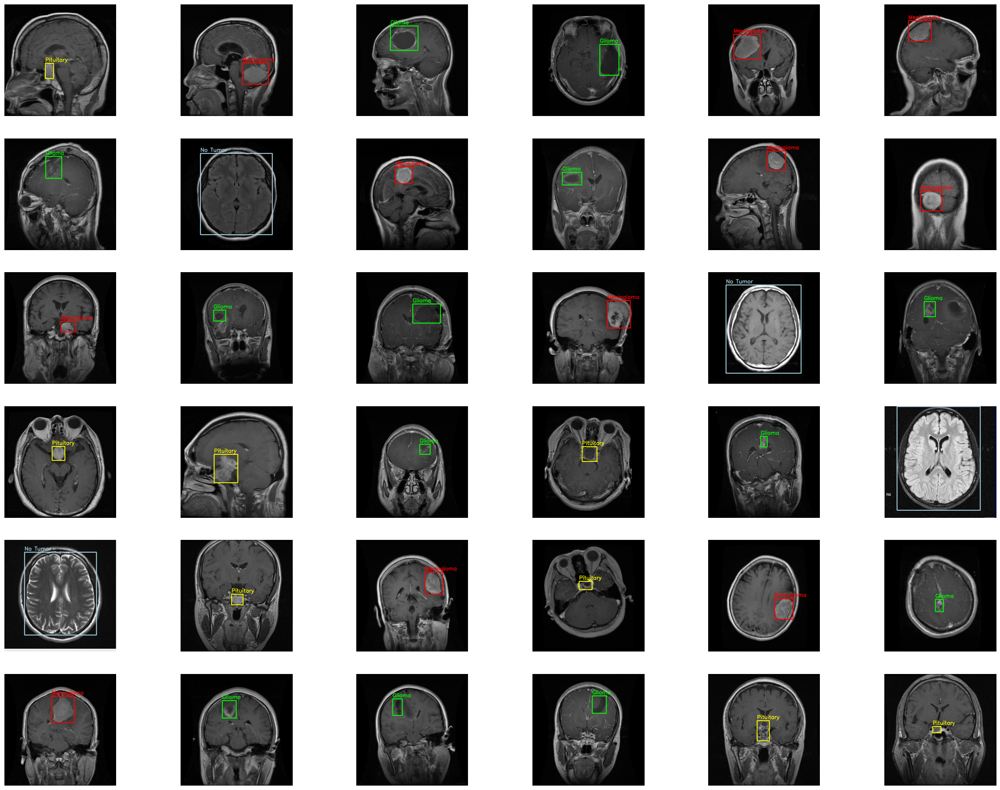

In [42]:
# Call the function to visualize random images from the training set
visualize_random_images(train_images, train_labels)

**Distribution of Tumor Classes**

In [43]:
def plot_class_distribution(train_directory, val_directory):
    """
    Plots the distribution of images across different classes in the training and validation datasets.

    Parameters:
    - train_directory: The root directory containing subfolders for each class in the training set.
    - val_directory: The root directory containing subfolders for each class in the validation set.
    """
    train_counts = {}  # Dictionary to store the count of images in the training set
    val_counts = {}  # Dictionary to store the count of images in the validation set

    # Loop through each class folder in the training directory
    for class_name in os.listdir(train_directory):
        # Get the path to the 'images' subfolder for the current class
        train_images_path = os.path.join(train_directory, class_name, 'images')
        val_images_path = os.path.join(val_directory, class_name, 'images')

        # Count the number of image files in the training set
        if os.path.exists(train_images_path):
            train_counts[class_name] = len(os.listdir(train_images_path))
        else:
            train_counts[class_name] = 0  # If no images folder exists, set count to 0

        # Count the number of image files in the validation set
        if os.path.exists(val_images_path):
            val_counts[class_name] = len(os.listdir(val_images_path))
        else:
            val_counts[class_name] = 0  # If no images folder exists, set count to 0

    # Prepare data for plotting
    classes = list(train_counts.keys())
    train_values = [train_counts[class_name] for class_name in classes]
    val_values = [val_counts[class_name] for class_name in classes]

    # Set the positions and width for the bars
    x = range(len(classes))
    width = 0.35  # Width of the bars

    # Create the bar plot
    plt.figure(figsize=(12, 6))  # Set the figure size
    plt.bar(x, train_values, width=width, label='Training Set', color='skyblue', alpha=0.7)  # Training bars
    plt.bar([p + width for p in x], val_values, width=width, label='Validation Set', color='lightgreen', alpha=0.7)  # Validation bars

    # Add titles and labels
    plt.title('Image Count per Class (Training & Validation)', fontsize=16, fontweight='bold')  # Title
    plt.xlabel('Class', fontsize=14)  # X-axis label
    plt.ylabel('Image Count', fontsize=14)  # Y-axis label
    plt.xticks([p + width / 2 for p in x], classes, rotation=45, fontsize=12)  # Center x-axis ticks
    plt.legend()  # Add legend
    plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines for y-axis
    plt.tight_layout()  # Adjust layout to prevent clipping
    plt.show()  # Display the plot

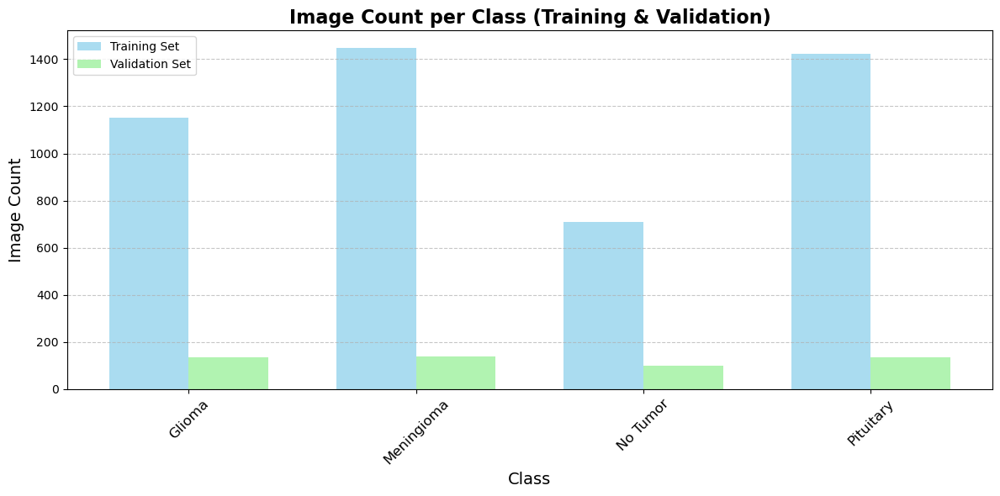

In [44]:
plot_class_distribution(train_path, val_path)

## **Data Preprocessing**

In [18]:
def images_preprocessing(images):
    """
    Preprocesses a list of images by resizing them to a fixed size.

    Parameters:
    - images: List of input images to be processed.

    Returns:
    - processed_images: NumPy array of resized images.
    """
    processed_images = []  # List to store processed images
    for img in images:  # Iterate through each image in the input list
        # Resize the image to 640x640 pixels
        img_resized = cv2.resize(img, (640, 640)) # Because Yolo Models takingonly 640*640 pixels sized Images

        # Append the resized image to the processed_images list
        processed_images.append(img_resized)

    # Convert the list of processed images to a NumPy array for better handling
    return np.array(processed_images)

In [19]:
# Preprocess training images
train_images = images_preprocessing(train_images)  # Resize training images to 640x640

# Preprocess validation images
val_images = images_preprocessing(val_images)  # Resize validation images to 640x640

In [20]:
train_images.shape, val_images.shape

((4737, 640, 640, 3), (509, 640, 640, 3))

**Visualizing Images in each Class**

In [21]:
def display_random_images(directory, num_images=4):
    
    """
    Displays a random selection of images from each class in the specified directory.

    Parameters:
    - directory: The root directory containing subfolders for each class.
    - num_images: Number of images to randomly display per class (default is 3).
    """

    # Loop through each class folder in the directory
    for class_name in os.listdir(directory):
        # Get the path to the current class folder
        class_path = os.path.join(directory, class_name)

        # Path to the 'images' subfolder within the current class folder
        images_path = os.path.join(directory, class_name, 'images')

        # Get a list of all image filenames in the 'images' folder
        images = os.listdir(images_path)

        # Randomly select a specified number of images from the list
        selected_images = random.sample(images, num_images)

        # Create a figure with a 1x3 grid of subplots
        fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

        # Add a title for the figure showing the current class name
        fig.suptitle(f"Displaying Images from {class_name}", fontsize=16, fontweight='bold')

        # Loop through the selected images and corresponding subplot axes
        for ax, image in zip(axes, selected_images):
            # Get the full path to the image
            image_path = os.path.join(images_path, image)

            # Read the image using matplotlib's image reader
            img = mpimg.imread(image_path)

            # Convert the image from BGR to RGB format for proper display
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Display the image on the current subplot axis
            ax.imshow(img)

            # Set the title of the subplot to the class name and image filename
            ax.set_title(f"{class_name} - {os.path.basename(image)}", fontweight='bold')

            # Remove the x and y ticks for a cleaner display
            ax.set_xticks([])
            ax.set_yticks([])

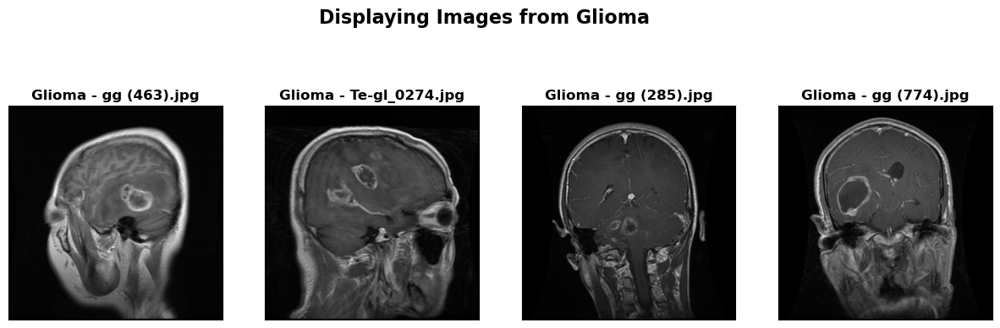

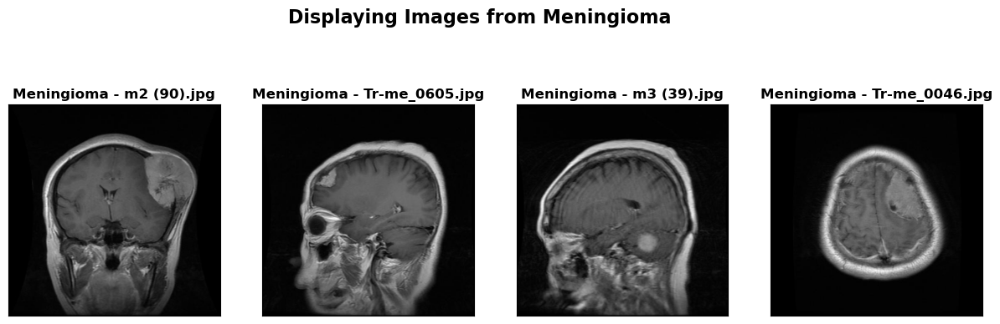

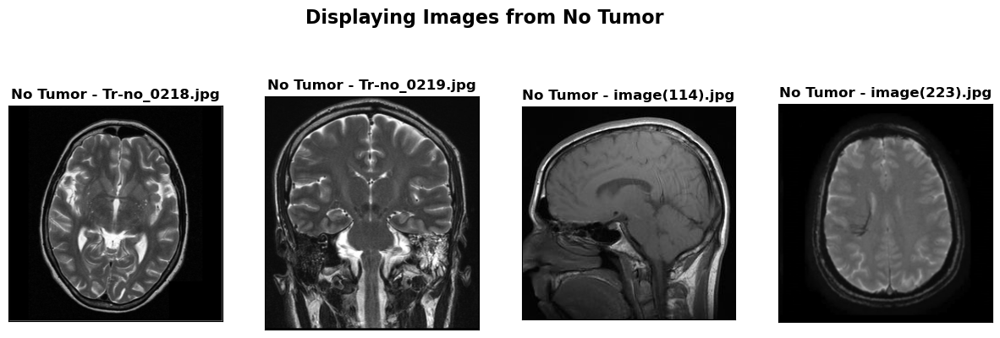

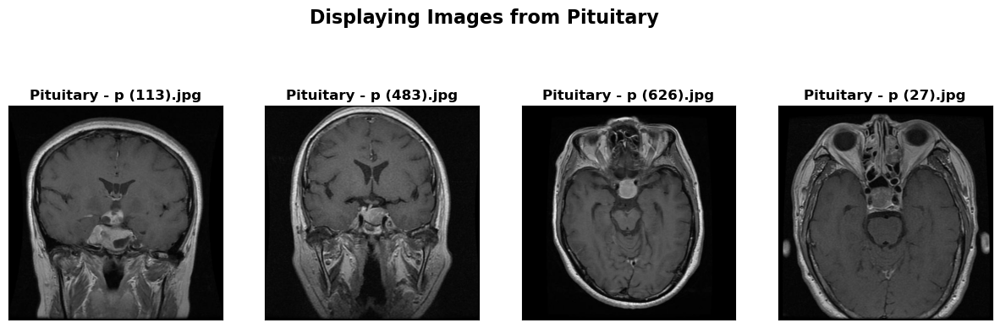

In [22]:
# Call the function to display random images from the training dataset
display_random_images(train_path)

In [23]:
# Define the directory structure
base_path = 'C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle'
train_path = os.path.join(base_path, 'Train')
val_path = os.path.join(base_path, 'Val')

# Create the directories
os.makedirs(train_path, exist_ok=True)
os.makedirs(val_path, exist_ok=True)

print(f"Directories created: {train_path}, {val_path}")

# Base path to check
base_path = 'C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle'
train_path = os.path.join(base_path, 'Train')
val_path = os.path.join(base_path, 'Val')

# Verify if directories exist
print("Train directory exists:", os.path.exists(train_path))
print("Validation directory exists:", os.path.exists(val_path))


Directories created: C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle\Train, C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle\Val
Train directory exists: True
Validation directory exists: True


**Converting the Dataset into YAML format**

In [24]:
import yaml  # Import the YAML library for handling YAML files

In [25]:
print(data_path)
print(train_path)
print(val_path)

C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle
C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle\Train
C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle\Val


In [26]:
# Define the dataset configuration as a dictionary
dataset_yaml = {
    'path': data_path,  # Base path for the dataset
    'train': train_path,  # Path to the training dataset
    'val': val_path,  # Path to the validation dataset
    'names': ["Glioma", "Meningioma", "No Tumor", "Pituitary"],  # Class names for the dataset
    'nc': 4  # Number of classes
}

In [27]:
# Specify the output path for the YAML file
output_yaml_path = 'C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Brain Tumor MRI Images for ML/dataset_yaml.yaml'

In [29]:
# Open the specified path in write mode to create or overwrite the YAML file
with open(output_yaml_path, 'w') as file:
    # Use yaml.dump() to write the dataset configuration to the file
    yaml.dump(dataset_yaml, file)

print(f"Dataset configuration saved to {output_yaml_path}")  # Confirm that the YAML file has been created


Dataset configuration saved to C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Brain Tumor MRI Images for ML/dataset_yaml.yaml


## **Modelling**

In [34]:
from ultralytics import YOLO  # Import the YOLO class from the Ultralytics package

In [35]:
# Load the YOLOv8 model with the specified weights
model = YOLO('yolo11s.pt')  # 'yolov8s.pt' is the pre-trained weights file for YOLOv8 Small model

![Description](https://miro.medium.com/v2/resize:fit:1100/format:webp/1*L8rMuwurmyBH1ixIqcrMSQ.png)


https://medium.com/@nikhil-rao-20/yolov11-explained-next-level-object-detection-with-enhanced-speed-and-accuracy-2dbe2d376f71

### YOLO11s Architecture Explained

The YOLO11s architecture consists of three main parts: Backbone, Neck, and Head. Here’s a simple explanation of each:

1. **Backbone:**
   - The Backbone is like the foundation of a building. It extracts important features from the input image, such as edges, shapes, and textures.
   - In YOLO11s, it uses a series of convolutional layers (filters) that process the image and reduce its size while increasing the depth (number of features) to capture detailed information.

2. **Neck:**
   - The Neck acts like a bridge that connects the Backbone to the Head. It combines and refines the features extracted by the Backbone.
   - This part of the model helps in creating feature pyramids, allowing it to detect objects at different scales (sizes). It ensures that both small and large objects can be identified effectively.

3. **Head:**
   - The Head is responsible for the final output of the model. It predicts the bounding boxes and class probabilities for each detected object in the image.
   - Essentially, the Head takes the refined features from the Neck and outputs information about where objects are located in the image (bounding boxes) and what those objects are (class labels).

### Summary:
- **Backbone:** Extracts features from the image.
- **Neck:** Combines and refines features for better detection.
- **Head:** Outputs predictions of object locations and classes.

This structure allows YOLO11s to quickly and accurately detect multiple objects in an image.

In [ ]:
# model.train(
#     data=data_path,
#     epochs=epochs,
#     batch=batch_size,
#     imgsz=imgsz,
#     device=[0, 1],
#     verbose=True,
#     project='my_project',  # Your custom project directory
#     name='my_model'  # Your custom run name
# )

In [26]:
# Train the model
train_results = model.train(
    data = output_yaml_path,  # Path to the dataset YAML configuration file
    epochs = 50,  # Number of training epochs (how many times to iterate over the training data)
    imgsz = 640,  # Size of images during training (640x640 pixels)
    device = "cuda",  # Specify the device to run the training (use 'cpu' or 'cuda' for GPU)
)

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=Brain Tumor MRI Images for ML/dataset_yaml.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_

100%|██████████| 755k/755k [00:00<00:00, 3.36MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 16.5MB/s]


AMP: checks passed ✅


train: Scanning /content/extracted_path/archive/Train/Glioma/labels... 4737 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4737/4737 [00:03<00:00, 1260.03it/s]


train: New cache created: /content/extracted_path/archive/Train/Glioma/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/extracted_path/archive/Val/Glioma/labels... 510 images, 3 backgrounds, 0 corrupt: 100%|██████████| 512/512 [00:00<00:00, 1062.11it/s]


val: New cache created: /content/extracted_path/archive/Val/Glioma/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.42G      1.042      1.914      1.236          5        640: 100%|██████████| 297/297 [01:22<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.99it/s]

                   all        512        554      0.692      0.634      0.752      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.38G      1.096      1.135      1.254          1        640: 100%|██████████| 297/297 [01:19<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.96it/s]

                   all        512        554      0.686       0.68      0.724      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.37G       1.09      1.068       1.24          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.91it/s]

                   all        512        554      0.772      0.736       0.79      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       4.4G      1.054      1.004      1.223          3        640: 100%|██████████| 297/297 [01:18<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.91it/s]

                   all        512        554       0.81      0.791      0.865      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.39G      1.013     0.9157      1.198          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.96it/s]

                   all        512        554      0.844       0.82      0.883      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.39G     0.9741     0.8461      1.184          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.92it/s]

                   all        512        554       0.84      0.786      0.863      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.36G     0.9733     0.8425       1.18          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.96it/s]

                   all        512        554      0.896      0.852      0.917      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.39G     0.9378      0.757      1.149          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]

                   all        512        554      0.922      0.817       0.91      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.39G     0.9224      0.742      1.149          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.94it/s]

                   all        512        554       0.91      0.858       0.93      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.39G     0.9144     0.7191      1.142          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.94it/s]

                   all        512        554      0.903      0.864      0.929      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.35G     0.8949      0.698      1.126          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.95it/s]

                   all        512        554      0.931      0.871      0.941      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.39G     0.8882     0.6898      1.126          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.96it/s]

                   all        512        554      0.932      0.861      0.931      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.39G     0.8832     0.6592       1.12          3        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.91it/s]

                   all        512        554      0.906      0.912      0.943      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.39G     0.8749     0.6442      1.112          3        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  4.00it/s]

                   all        512        554      0.901      0.901      0.949      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.35G     0.8732     0.6475      1.113          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.99it/s]

                   all        512        554      0.928      0.887      0.947      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.39G      0.864     0.6383      1.111          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.95it/s]

                   all        512        554      0.917      0.903      0.945       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.39G     0.8552     0.6349      1.105          0        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]

                   all        512        554      0.954      0.883      0.947      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.39G      0.844     0.5926      1.099          4        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]

                   all        512        554       0.91       0.91       0.95      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.35G     0.8301     0.6007      1.089          0        640: 100%|██████████| 297/297 [01:17<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.01it/s]

                   all        512        554      0.898      0.903      0.945      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.39G     0.8301     0.5672      1.093          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.93it/s]

                   all        512        554       0.93      0.895      0.953      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.39G     0.8199     0.5646      1.085          4        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]

                   all        512        554       0.94      0.898      0.946      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.39G     0.8069     0.5543      1.081          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.97it/s]

                   all        512        554      0.933      0.903      0.957      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.36G     0.8034     0.5447      1.077          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  4.00it/s]

                   all        512        554      0.941      0.907      0.957      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.39G      0.788     0.5292       1.07          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.96it/s]

                   all        512        554      0.926      0.925      0.962      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       4.4G     0.7911     0.5312      1.072          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]

                   all        512        554      0.941      0.914      0.956      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.39G     0.7932     0.5286      1.076          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]

                   all        512        554      0.929      0.934      0.956      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.36G     0.7857     0.5182      1.068          4        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.89it/s]

                   all        512        554      0.944      0.926       0.96       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.39G     0.7854     0.5091      1.064          5        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.99it/s]

                   all        512        554       0.94      0.905      0.961      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       4.4G      0.771      0.502      1.061          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.99it/s]

                   all        512        554      0.947      0.904      0.953      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.39G     0.7643     0.4938      1.058          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.93it/s]

                   all        512        554      0.946      0.922      0.958      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.35G     0.7637     0.4856      1.054          3        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.99it/s]

                   all        512        554      0.917      0.925      0.959      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.39G     0.7597     0.4744      1.051          0        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]

                   all        512        554      0.944       0.92       0.96      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.39G       0.76     0.4855      1.061          4        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.93it/s]

                   all        512        554      0.944      0.923      0.962      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.39G     0.7541     0.4745      1.054          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]

                   all        512        554      0.943      0.933      0.962      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.36G     0.7398     0.4657      1.048          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.00it/s]

                   all        512        554      0.952      0.917       0.96      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.39G     0.7359     0.4631       1.04          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.97it/s]

                   all        512        554      0.956       0.92      0.961      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.39G     0.7415     0.4504      1.046          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.01it/s]

                   all        512        554       0.94      0.952      0.964      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.39G     0.7392     0.4524      1.043          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.00it/s]

                   all        512        554      0.965       0.92      0.967      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.35G     0.7229     0.4366      1.037          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.95it/s]

                   all        512        554      0.953      0.917      0.963      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.39G     0.7161     0.4293      1.026          6        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  4.00it/s]

                   all        512        554      0.956      0.924       0.96      0.779


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.39G      0.676     0.3825       1.01          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.00it/s]

                   all        512        554      0.946      0.945      0.959      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.39G      0.669     0.3711      1.004          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.95it/s]

                   all        512        554      0.955      0.922       0.96      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.35G     0.6563     0.3655     0.9958          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.97it/s]

                   all        512        554      0.953      0.929       0.96      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.39G     0.6473     0.3696       0.99          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.97it/s]

                   all        512        554       0.96      0.935      0.959      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.39G     0.6385     0.3463     0.9843          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.97it/s]

                   all        512        554      0.956      0.929      0.959      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.39G     0.6303      0.342     0.9804          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.99it/s]

                   all        512        554      0.949      0.938      0.958      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.35G      0.629     0.3333     0.9797          1        640: 100%|██████████| 297/297 [01:17<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.96it/s]

                   all        512        554      0.943      0.948      0.962      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       4.4G     0.6227     0.3309     0.9778          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.99it/s]

                   all        512        554      0.948       0.95      0.962      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.39G     0.6154     0.3306     0.9652          1        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.99it/s]

                   all        512        554      0.949      0.944       0.96      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.39G     0.6109     0.3186     0.9683          2        640: 100%|██████████| 297/297 [01:18<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.01it/s]

                   all        512        554      0.947      0.948      0.962      0.797



50 epochs completed in 1.159 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 19.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11s summary (fused): 238 layers, 9,414,348 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.81it/s]


                   all        512        554      0.947      0.948      0.962      0.797
                Glioma        135        153      0.907      0.902      0.934      0.757
            Meningioma        140        142      0.987      0.993      0.994      0.845
              No Tumor         98         98      0.976       0.99      0.978      0.835
             Pituitary        154        161      0.918      0.907      0.942      0.749
Speed: 0.2ms preprocess, 4.6ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train


In [31]:
# Export the model to ONNX format with a specified save directory and filename
path = model.export(format="onnx", save_dir='/Kaggle/extracted_path', name='YOLO11s_brain_tumor_model')

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLO11s summary (fused): 238 layers, 9,414,348 parameters, 0 gradients, 21.3 GFLOPs

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 8, 8400) (18.3 MB)

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.42...
ONNX: export success ✅ 1.6s, saved as 'runs/detect/train/weights/best.onnx' (36.2 MB)

Export complete (2.2s)
Results saved to /content/runs/detect/train/weights
Predict:         yolo predict task=detect model=runs/detect/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=runs/detect/train/weights/best.onnx imgsz=640 data=Brain Tumor MRI Images for ML/dataset_yaml.yaml  
Visualize:       https://netron.app


## **Performance Evaluation**

**Load the trained Model**

In [71]:
model = YOLO('best.pt')

In [46]:
print(len(val_images))


509


**Visualizing Predictions on Random Images from Validation**

Label file C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle\Val\Glioma\labels\gg (342).txt is empty, skipping this image.
Label file C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle\Val\No Tumor\labels\image(55).txt not found, skipping this image.
Label file C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle\Val\No Tumor\labels\image(61).txt not found, skipping this image.

0: 640x640 1 Pituitary, 396.5ms
Speed: 19.6ms preprocess, 396.5ms inference, 29.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Pituitary, 235.3ms
Speed: 6.6ms preprocess, 235.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Meningioma, 200.2ms
Speed: 5.5ms preprocess, 200.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Meningioma, 243.2ms
Speed: 7.5ms preprocess, 243.2ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Pituitary, 257.1ms
Speed: 3.8ms preproc

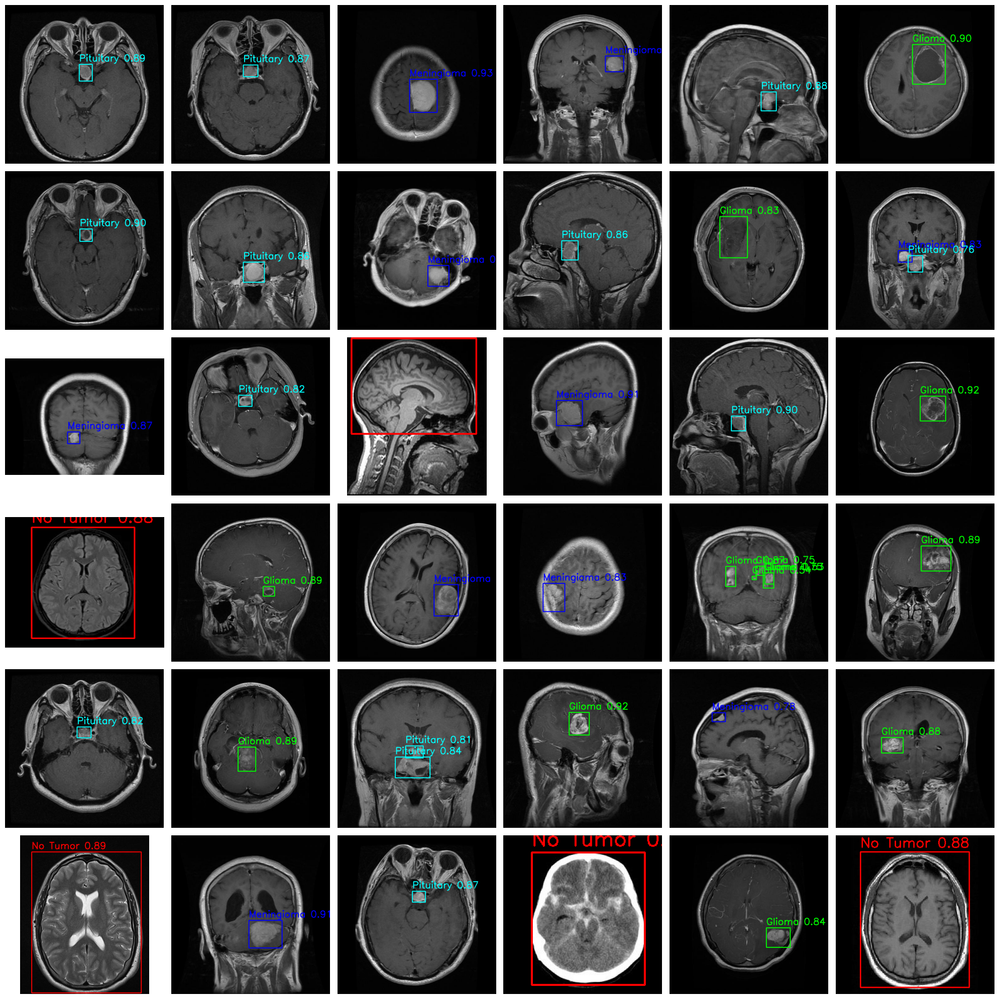

In [47]:
# List of class names corresponding to class IDs
classes = ["Glioma", "Meningioma", "No Tumor", "Pituitary"]

# Define colors for each class
colors = {
    "Glioma": (0, 255, 0),     # Green
    "Meningioma": (255, 0, 0), # Red
    "No Tumor": (0, 0, 255),   # Blue
    "Pituitary": (255, 255, 0) # Yellow
}

# Load validation images and labels (assuming this function is defined elsewhere)
val_images, val_labels = load_data(val_path)

# Randomly select 18 images from the validation dataset for visualization
sample_images = random.sample(val_images, 36)

# Create a 6x3 grid of subplots for displaying the images
fig, axs = plt.subplots(6, 6, figsize=(20, 20))  # 6 rows, 6 columns

# Flatten the axes array for easy indexing
axs = axs.flatten()

# Iterate through each selected image
for i, image in enumerate(sample_images):
    # Use the YOLO model to make predictions on the image
    results = model.predict(image, imgsz=640)  # Predict with the image resized to 640x640

    # Iterate through the detected objects (bounding boxes) in the prediction results
    for result in results[0].boxes:
        # Extract bounding box coordinates (x1, y1, x2, y2)
        x1, y1, x2, y2 = map(int, result.xyxy[0])

        # Get the predicted class ID and corresponding class label
        class_id = int(result.cls[0])
        label = classes[class_id]

        # Get the confidence score
        conf = result.conf[0].cpu().numpy()

        # Draw a rectangle around the detected object in the image
        cv2.rectangle(image, (x1, y1), (x2, y2), colors[label], 2)  # Use corresponding color

        # Add the class label and confidence score as text above the rectangle
        cv2.putText(image, f"{label} {conf:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, colors[label], 2)

    # Display the processed image in the corresponding subplot
    axs[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
    axs[i].axis('off')  # Hide axes for cleaner visualization

# Remove unused subplots, if any
for j in range(len(sample_images), len(axs)):
    axs[j].axis('off')

# Adjust spacing between subplots to prevent overlap
plt.tight_layout()

# Show the plot with all processed images
plt.show()


**Performace Metrics of the Model (On the Validation Set)**

In [48]:
# Evaluate model performance on the validation set
metrics = model.val()  # Validate the model on the validation dataset and retrieve metrics

Ultralytics 8.3.39  Python-3.12.3 torch-2.5.1 CPU (11th Gen Intel Core(TM) i7-11390H 3.40GHz)


val: Scanning C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\Glioma\labels.cache... 510 images, 3 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [01:40


                   all        512        554      0.946      0.941      0.964        0.8
                Glioma        135        153      0.913      0.895      0.936      0.769
            Meningioma        140        142      0.972      0.986      0.994      0.838
              No Tumor         98         98       0.98      0.993      0.981      0.831
             Pituitary        154        161       0.92      0.888      0.945      0.763
Speed: 1.3ms preprocess, 187.2ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs\detect\val


In [49]:
print(f"Mean Average Precision @.5:.95 : {metrics.box.map}")    
print(f"Mean Average Precision @ .50   : {metrics.box.map50}") 
print(f"Mean Average Precision @ .70   : {metrics.box.map75}")

Mean Average Precision @.5:.95 : 0.8004344594114293
Mean Average Precision @ .50   : 0.9640775854709658
Mean Average Precision @ .70   : 0.9051783770546993


In [50]:
metrics_dict = metrics.results_dict

print(f"Precision: {metrics_dict['metrics/precision(B)']}")
print(f"Recall: {metrics_dict['metrics/recall(B)']}")
print(f"mAP@0.5: {metrics_dict['metrics/mAP50(B)']}")
print(f"mAP@0.5:0.95: {metrics_dict['metrics/mAP50-95(B)']}")


Precision: 0.9463543324661303
Recall: 0.9406807904367323
mAP@0.5: 0.9640775854709658
mAP@0.5:0.95: 0.8004344594114293


**Intersection over Union (IoU) threshold** is a metric used in object detection to evaluate the overlap between a predicted bounding box and the ground truth (actual) bounding box. It is calculated as:

\[
\text{IoU} = \frac{\text{Area of Overlap}}{\text{Area of Union}}
\]

### Key Points:
1. **IoU Threshold:** The IoU value used to determine whether a prediction is considered correct. For example:
   - If the IoU threshold is set to **0.5**, a predicted bounding box is considered correct if it overlaps with the ground truth by at least 50%.
   
2. **Purpose:** It helps measure how well the predicted bounding box aligns with the actual object.

3. **Strictness:** 
   - A higher IoU threshold (e.g., 0.75) demands more precise predictions.
   - A lower IoU threshold (e.g., 0.5) allows for more lenient evaluation.

4. **mAP@50 vs. mAP@50-95:**
   - **mAP@50:** Mean Average Precision at IoU threshold of 0.5 (standard metric, more lenient).
   - **mAP@50-95:** Mean Average Precision averaged over IoU thresholds from 0.5 to 0.95 in increments of 0.05 (stricter metric).

This output shows the evaluation metrics for your model on the validation dataset. Here's a concise interpretation of the provided metrics:

### Overall Metrics (`all`):
- **Images:** A total of 512 images were evaluated.
- **Instances:** These images contained 554 labeled instances (bounding boxes).
- **Precision (P):** 0.946 (94.6%) – Out of all predicted positive cases, 94.6% were correct.
- **Recall (R):** 0.941 (94.1%) – Out of all actual positive cases, 94.1% were correctly identified.
- **mAP@50:** 0.964 (96.4%) – The mean Average Precision at IoU threshold 0.5. A high value indicates the model's good detection performance.
- **mAP@50-95:** 0.8 (80%) – The mean Average Precision across multiple IoU thresholds (from 0.5 to 0.95, in 0.05 increments). Indicates how well the model detects objects with varying overlap thresholds.

### Per-Class Metrics:
1. **Glioma:**
   - Precision: 0.913 (91.3%) – The model correctly predicted 91.3% of all "Glioma" detections.
   - Recall: 0.895 (89.5%) – The model detected 89.5% of all actual "Glioma" instances.
   - mAP@50: 0.936 (93.6%) – High detection accuracy for "Glioma."
   - mAP@50-95: 0.769 (76.9%) – Moderate detection accuracy across stricter IoU thresholds.

2. **Meningioma:**
   - Precision: 0.972 (97.2%) – Very few false positives for "Meningioma."
   - Recall: 0.986 (98.6%) – Almost all "Meningioma" instances were detected.
   - mAP@50: 0.994 (99.4%) – Exceptional performance in detecting "Meningioma."
   - mAP@50-95: 0.838 (83.8%) – Strong performance even with stricter overlap criteria.

3. **No Tumor:**
   - Precision: 0.980 (98.0%) – Almost all detections for "No Tumor" were accurate.
   - Recall: 0.993 (99.3%) – Very high detection rate for "No Tumor."
   - mAP@50: 0.981 (98.1%) – Near-perfect detection accuracy.
   - mAP@50-95: 0.831 (83.1%) – Solid performance across IoU thresholds.

4. **Pituitary:**
   - Precision: 0.920 (92.0%) – Most detections for "Pituitary" were correct.
   - Recall: 0.888 (88.8%) – The model detected 88.8% of "Pituitary" instances.
   - mAP@50: 0.945 (94.5%) – Good detection accuracy for "Pituitary."
   - mAP@50-95: 0.763 (76.3%) – Slightly weaker performance under stricter IoU thresholds.

### Key Takeaways:
- The model performs exceptionally well overall, with high precision, recall, and mAP scores.
- "Meningioma" and "No Tumor" have the best detection performance, especially in terms of recall and mAP.
- "Pituitary" and "Glioma" are slightly weaker, particularly under stricter IoU thresholds (mAP@50-95), indicating room for improvement in localization accuracy or consistency for these classes.

In [144]:
result

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.])
conf: tensor([0.6231])
data: tensor([[163.9832, 175.9494, 286.2049, 253.8447,   0.6231,   0.0000]])
id: None
is_track: False
orig_shape: (512, 512)
shape: torch.Size([1, 6])
xywh: tensor([[225.0940, 214.8970, 122.2217,  77.8953]])
xywhn: tensor([[0.4396, 0.4197, 0.2387, 0.1521]])
xyxy: tensor([[163.9832, 175.9494, 286.2049, 253.8447]])
xyxyn: tensor([[0.3203, 0.3437, 0.5590, 0.4958]])

**Visualizing Predictions in each Class of Validation Set**


image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\Glioma\images\gg (33).jpg: 640x640 1 Glioma, 198.7ms
Speed: 6.0ms preprocess, 198.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\Glioma\images\Tr-gl_1301.jpg: 640x640 1 Glioma, 173.0ms
Speed: 4.0ms preprocess, 173.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\Glioma\images\Tr-gl_1171.jpg: 640x640 1 Glioma, 1 Pituitary, 206.0ms
Speed: 2.0ms preprocess, 206.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\Glioma\images\gg (29).jpg: 640x640 2 Gliomas, 193.5ms
Speed: 5.3ms preprocess, 193.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiy

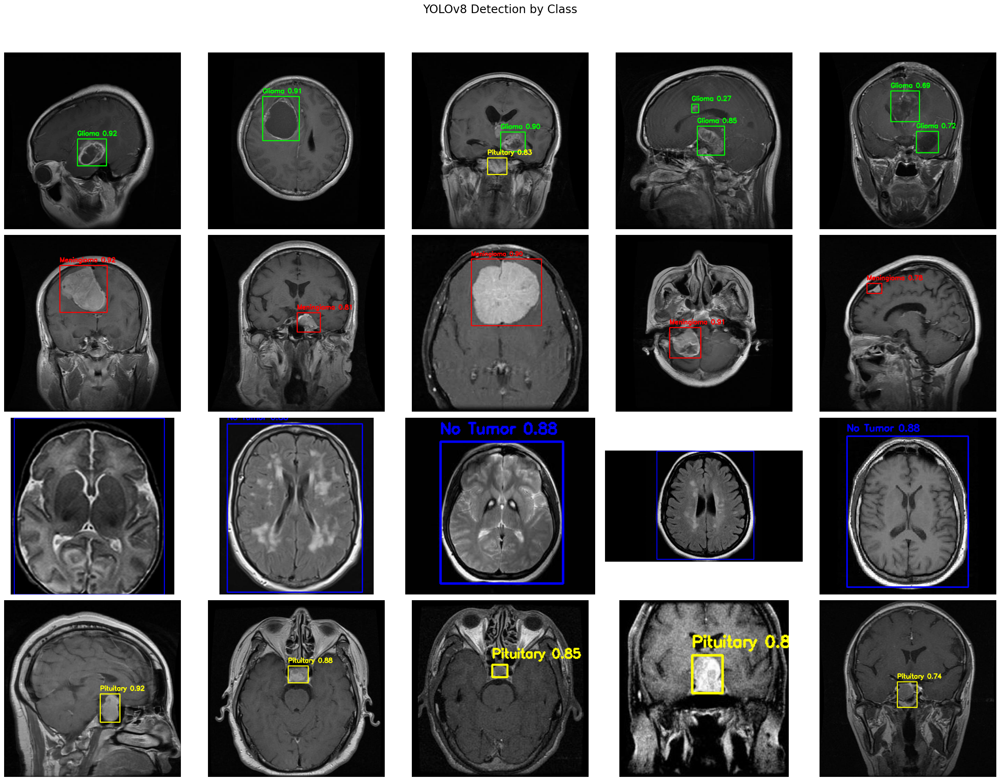

In [55]:
# List of directories containing validation images for each class
image_dirs = [
    "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/Glioma/images",
    "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/Meningioma/images",
    "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/No Tumor/images",
    "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/Pituitary/images"
]

# List of class names and corresponding colors
classes = ["Glioma", "Meningioma", "No Tumor", "Pituitary"]
colors = {
    "Glioma": (0, 255, 0),        # Green
    "Meningioma": (255, 0, 0),    # Red
    "No Tumor": (0, 0, 255),      # Blue
    "Pituitary": (255, 255, 0)    # Yellow
}

# Create a figure for all images
fig, axs = plt.subplots(len(image_dirs), 5, figsize=(25, len(image_dirs) * 5))  # 5 images per row
fig.suptitle('YOLO11s Detection by Class', fontsize=20)

# Process each class directory
for class_idx, image_dir in enumerate(image_dirs):
    # Gather all image filenames in the directory
    all_images = [img for img in os.listdir(image_dir) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    # Select the 5 random images
    selected_images = random.sample(all_images, 5)

    # Title for the row indicating the class name
    axs[class_idx, 0].set_ylabel(classes[class_idx], fontsize=16, rotation=0, labelpad=50)

    # Process each selected image
    for img_idx, img_name in enumerate(selected_images):
        img_path = os.path.join(image_dir, img_name)

        # Perform prediction using the YOLO model
        results = model.predict(img_path)

        # Load the image using OpenCV and convert it to RGB
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Overlay predictions on the image
        for result in results[0].boxes:
            # Get bounding box coordinates, confidence score, and class ID
            x1, y1, x2, y2 = map(int, result.xyxy[0])
            conf = float(result.conf[0])  # Confidence score
            class_id = int(result.cls[0])
            label = classes[class_id]
            color = colors[label]

            # Draw bounding box
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

            # Add label and confidence score
            cv2.putText(
                img, 
                f"{label} {conf:.2f}", 
                (x1, y1 - 10), 
                cv2.FONT_HERSHEY_SIMPLEX, 
                0.6, 
                color, 
                2
            )

        # Display the processed image in the appropriate subplot
        axs[class_idx, img_idx].imshow(img)
        axs[class_idx, img_idx].axis('off')  # Turn off axis labels

# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Leave space for the main title
plt.show()


## **True vs Predicted**


image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\Glioma\images\Tr-gl_0371.jpg: 640x640 1 Glioma, 433.9ms
Speed: 14.0ms preprocess, 433.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\Meningioma\images\Tr-me_1120.jpg: 640x640 1 Meningioma, 401.2ms
Speed: 16.4ms preprocess, 401.2ms inference, 8.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\No Tumor\images\image(241).jpg: 640x640 1 No Tumor, 391.4ms
Speed: 16.1ms preprocess, 391.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\Pituitary\images\Tr-pi_1430.jpg: 640x640 1 Pituitary, 394.9ms
Speed: 8.0ms preprocess, 394.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


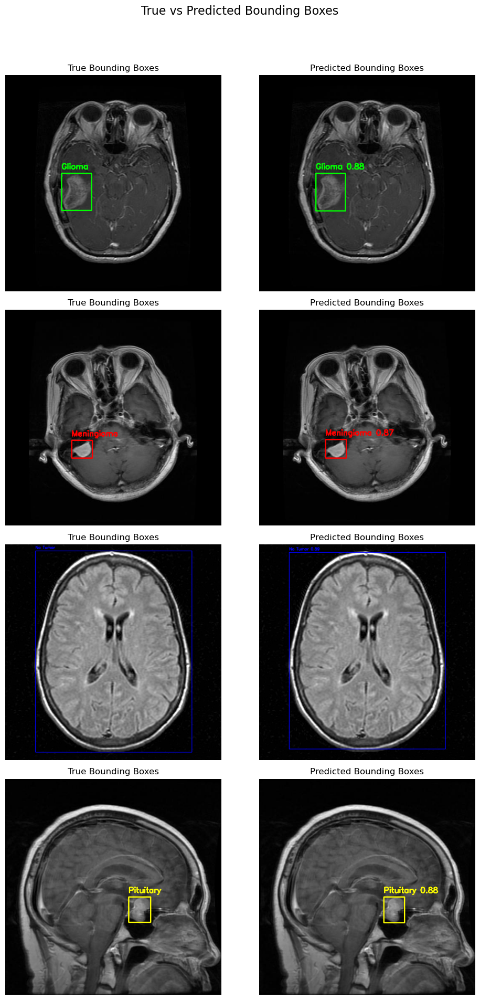

In [72]:
# Directories for images and labels
base_dirs = {
    "Glioma": {
        "images": "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/Glioma/images",
        "labels": "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/Glioma/labels"
    },
    "Meningioma": {
        "images": "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/Meningioma/images",
        "labels": "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/Meningioma/labels"
    },
    "No Tumor": {
        "images": "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/No Tumor/images",
        "labels": "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/No Tumor/labels"
    },
    "Pituitary": {
        "images": "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/Pituitary/images",
        "labels": "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/Val/Pituitary/labels"
    }
}

colors = {
    "Glioma": (0, 255, 0),
    "Meningioma": (255, 0, 0),
    "No Tumor": (0, 0, 255),
    "Pituitary": (255, 255, 0)
}

def load_image_and_labels(image_dir, label_dir):
    # Pick a random image
    all_images = [img for img in os.listdir(image_dir) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
    selected_image = random.choice(all_images)
    image_path = os.path.join(image_dir, selected_image)

    # Load corresponding label
    label_path = os.path.join(label_dir, selected_image.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))
    true_boxes = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f.readlines():
                cls, x_center, y_center, width, height = map(float, line.strip().split())
                true_boxes.append((int(cls), x_center, y_center, width, height))
    return image_path, true_boxes

def plot_images(image_path, true_boxes, class_name, ax1, ax2):
    # Load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot true labels
    img_true = img.copy()
    for cls, x_center, y_center, width, height in true_boxes:
        x1 = int((x_center - width / 2) * img.shape[1])
        y1 = int((y_center - height / 2) * img.shape[0])
        x2 = int((x_center + width / 2) * img.shape[1])
        y2 = int((y_center + height / 2) * img.shape[0])
        cv2.rectangle(img_true, (x1, y1), (x2, y2), colors[class_name], 2)
        cv2.putText(img_true, class_name, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, colors[class_name], 2)

    ax1.imshow(img_true)
    ax1.set_title("True Bounding Boxes")
    ax1.axis('off')

    # Perform prediction
    results = model.predict(image_path, conf=0.25)
    img_pred = img.copy()
    for result in results[0].boxes:
        x1, y1, x2, y2 = map(int, result.xyxy[0])
        cls = int(result.cls[0])
        conf = result.conf[0]
        label = list(colors.keys())[cls]
        cv2.rectangle(img_pred, (x1, y1), (x2, y2), colors[label], 2)
        cv2.putText(img_pred, f"{label} {conf:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, colors[label], 2)

    ax2.imshow(img_pred)
    ax2.set_title("Predicted Bounding Boxes")
    ax2.axis('off')

# Create a figure
fig, axs = plt.subplots(4, 2, figsize=(10, 20))
fig.suptitle("True vs Predicted Bounding Boxes", fontsize=16)

for idx, class_name in enumerate(base_dirs.keys()):
    image_path, true_boxes = load_image_and_labels(base_dirs[class_name]['images'], base_dirs[class_name]['labels'])
    plot_images(image_path, true_boxes, class_name, axs[idx, 0], axs[idx, 1])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()



image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\Glioma\images\Tr-gl_0474.jpg: 640x640 1 Glioma, 448.1ms
Speed: 7.5ms preprocess, 448.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\Meningioma\images\m1(65).jpg: 640x640 1 Meningioma, 387.2ms
Speed: 16.2ms preprocess, 387.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\No Tumor\images\image(156).jpg: 640x448 1 No Tumor, 556.7ms
Speed: 14.1ms preprocess, 556.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 C:\Users\muaaz\OneDrive - UT Arlington\Muaaz Faiyazuddin\Kaggle\Val\Pituitary\images\Tr-pi_0089.jpg: 640x640 1 Pituitary, 412.4ms
Speed: 13.0ms preprocess, 412.4ms inference, 7.9ms postprocess per image at shape (1, 3, 640, 640)


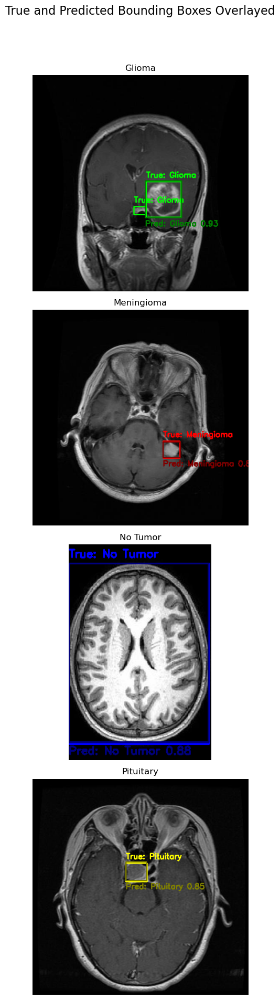

In [73]:
def load_image_and_labels(image_dir, label_dir):
    # Pick a random image
    all_images = [img for img in os.listdir(image_dir) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
    selected_image = random.choice(all_images)
    image_path = os.path.join(image_dir, selected_image)

    # Load corresponding label
    label_path = os.path.join(label_dir, selected_image.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))
    true_boxes = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f.readlines():
                cls, x_center, y_center, width, height = map(float, line.strip().split())
                true_boxes.append((int(cls), x_center, y_center, width, height))
    return image_path, true_boxes

def plot_combined_image(image_path, true_boxes, class_name, ax):
    # Load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Overlay true bounding boxes
    for cls, x_center, y_center, width, height in true_boxes:
        x1 = int((x_center - width / 2) * img.shape[1])
        y1 = int((y_center - height / 2) * img.shape[0])
        x2 = int((x_center + width / 2) * img.shape[1])
        y2 = int((y_center + height / 2) * img.shape[0])
        cv2.rectangle(img, (x1, y1), (x2, y2), colors[class_name], 2)
        cv2.putText(img, f"True: {class_name}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, colors[class_name], 2)

    # Perform prediction and overlay predicted bounding boxes
    results = model.predict(image_path, conf=0.25)
    for result in results[0].boxes:
        x1, y1, x2, y2 = map(int, result.xyxy[0])
        cls = int(result.cls[0])
        conf = result.conf[0]
        label = list(colors.keys())[cls]
        color = tuple([c // 2 for c in colors[label]])  # Slightly dimmer color for prediction
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
        cv2.putText(img, f"Pred: {label} {conf:.2f}", (x1, y2 + 20), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    # Plot the combined image
    ax.imshow(img)
    ax.set_title(class_name)
    ax.axis('off')

# Create a figure
fig, axs = plt.subplots(4, 1, figsize=(10, 20))
fig.suptitle("True and Predicted Bounding Boxes Overlayed", fontsize=16)

for idx, class_name in enumerate(base_dirs.keys()):
    image_path, true_boxes = load_image_and_labels(base_dirs[class_name]['images'], base_dirs[class_name]['labels'])
    plot_combined_image(image_path, true_boxes, class_name, axs[idx])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


**Evaluation Metrics**

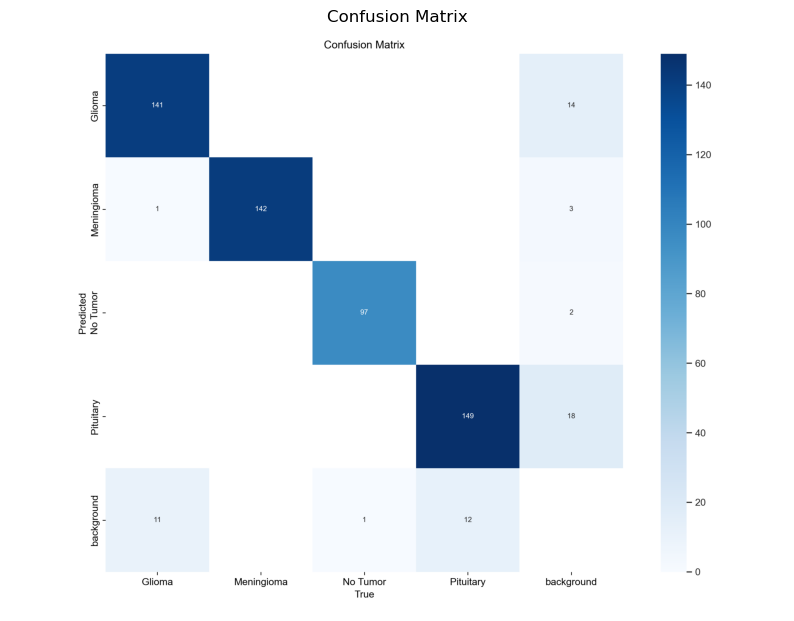

In [58]:
# Load and display the confusion matrix
confusion_matrix_path = "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/runs/detect/val/confusion_matrix.png"
confusion_matrix_img = Image.open(confusion_matrix_path)

plt.figure(figsize=(10, 10))
plt.title("Confusion Matrix")
plt.imshow(confusion_matrix_img)
plt.axis('off')
plt.show()

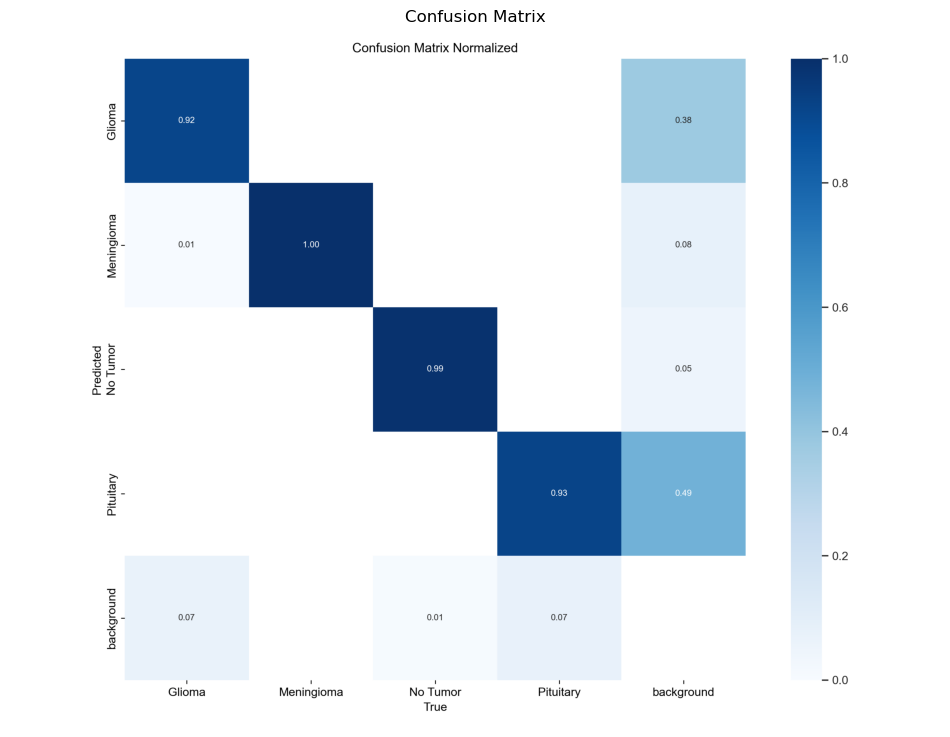

In [66]:
# Load and display the confusion matrix
confusion_matrix_path = "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/runs/detect/val/confusion_matrix_normalized.png"
confusion_matrix_img = Image.open(confusion_matrix_path)

plt.figure(figsize=(12, 12))
plt.title("Confusion Matrix")
plt.imshow(confusion_matrix_img)
plt.axis('off')
plt.show()

Explanation:
The confusion matrix provides a visual breakdown of the true positives, false positives, false negatives, and true negatives for each class.

Rows represent the actual class, and columns represent the predicted class.
A diagonal dominance indicates good model performance, as it implies most predictions align with the actual class.

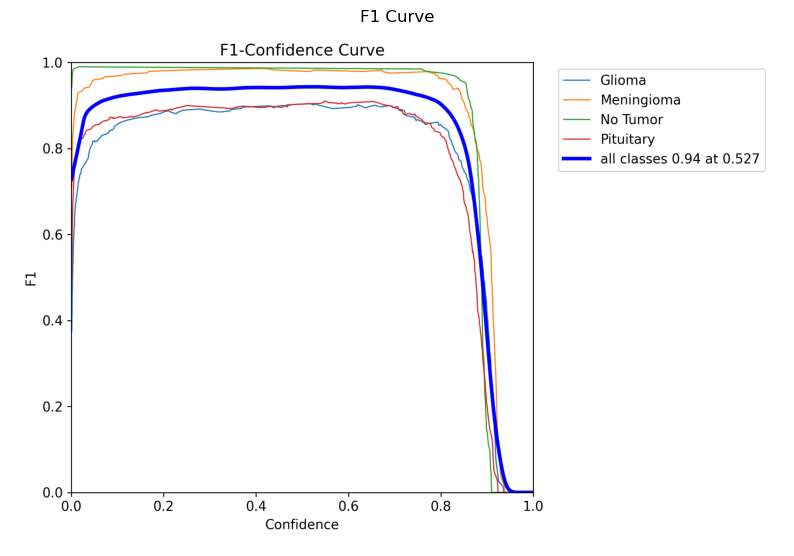

In [60]:
# Load and display the F1 curve
f1_curve_path = "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/runs/detect/val/f1_curve.png"
f1_curve_img = Image.open(f1_curve_path)

plt.figure(figsize=(10, 10))
plt.title("F1 Curve")
plt.imshow(f1_curve_img)
plt.axis('off')
plt.show()


Explanation:
The F1 curve shows the balance between precision and recall across different confidence thresholds for the model predictions.

A high F1 score indicates a good balance.
Look for where the curve peaks, as it shows the optimal threshold for performance.


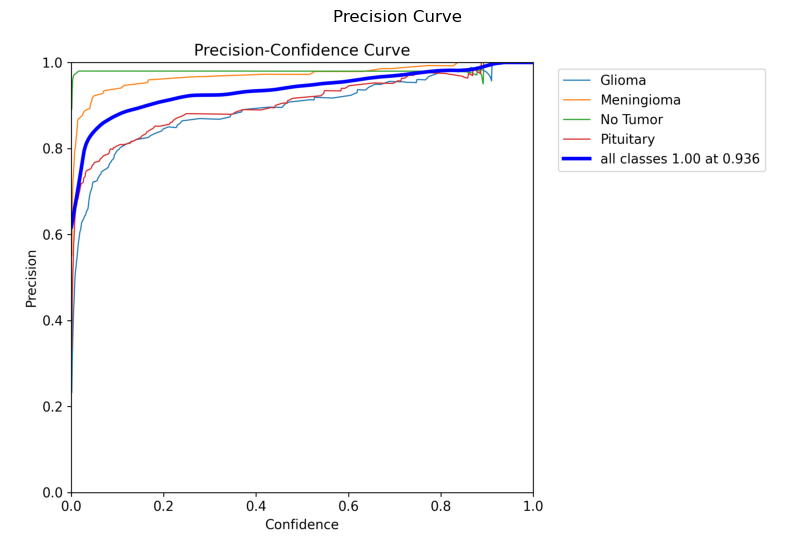

In [62]:
# Load and display the precision curve
precision_curve_path = "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/runs/detect/val/P_curve.png"
precision_curve_img = Image.open(precision_curve_path)

plt.figure(figsize=(10, 10))
plt.title("Precision Curve")
plt.imshow(precision_curve_img)
plt.axis('off')
plt.show()

Explanation:
The precision curve represents the proportion of true positive predictions to the total positive predictions (true positives + false positives) across confidence thresholds.

A higher curve indicates fewer false positives.
Important for applications where minimizing false alarms is critical.

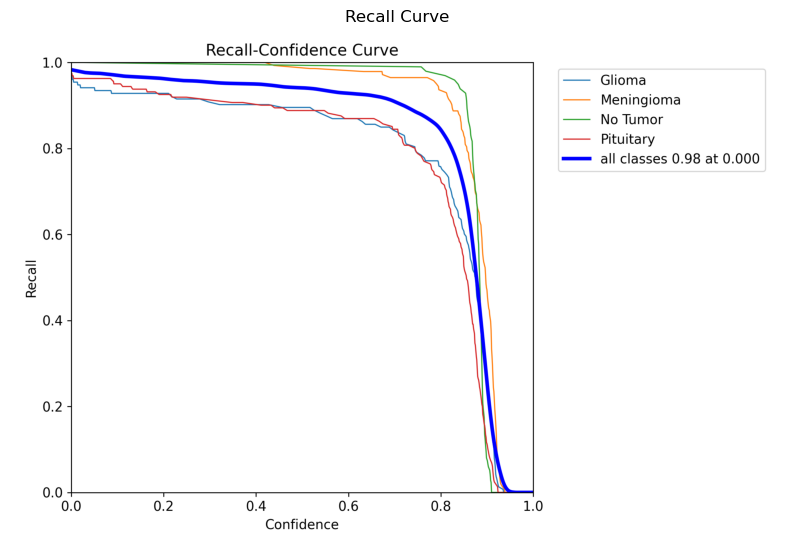

In [63]:
# Load and display the recall curve
recall_curve_path = "C:/Users/muaaz/OneDrive - UT Arlington/Muaaz Faiyazuddin/Kaggle/runs/detect/val/R_curve.png"
recall_curve_img = Image.open(recall_curve_path)

plt.figure(figsize=(10, 10))
plt.title("Recall Curve")
plt.imshow(recall_curve_img)
plt.axis('off')
plt.show()


Explanation:
The recall curve indicates the proportion of true positives detected out of all actual positives across confidence thresholds.

A higher curve indicates better detection of actual positives.
Important in applications where missing true positives (e.g., detecting diseases) is critical.

_______________________________________________________________________________________________________________________________________________________